In [2]:
%matplotlib inline
import matplotlib.pyplot as plt
import xarray as xr
from xgcm import Grid
import numpy as np
import pandas as pd
from scipy import signal

import IPython.display
import cmocean as cm
import sys, os, glob
import warnings
warnings.simplefilter("ignore") 

from IPython.display import Image

from dask.distributed import Client

In [3]:
# Load workers:
client = Client(n_workers=16)
client

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/8787/status,
Dashboard: /proxy/8787/status,Workers: 16
Total threads: 16,Total memory: 44.92 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:39149,Workers: 16
Dashboard: /proxy/8787/status,Total threads: 16
Started: Just now,Total memory: 44.92 GiB
Comm: tcp://127.0.0.1:46263,Total threads: 1
Dashboard: /proxy/42423/status,Memory: 2.81 GiB
Nanny: tcp://127.0.0.1:38267,


## Load datasets

In [4]:
base = '/g/data/e14/rmh561/croco'
base_data = base + '/archive'

# CROCO paths etc:
exp = 'PAC12_75_cpl'
expn = '01'
os.chdir(base + '/analysis/' + exp)

In [7]:
CROCO = xr.open_dataset(base_data + '/PAC12_75/PAC12_75_exp11/20140101_20140630/croco_out_mon.nc')
CROCO_WRF = xr.open_dataset(base_data + '/PAC12_75_cpl/croco_out_mon.ncrcat.nc')
DIFF = xr.open_dataset(base_data + '/PAC12_75_cpl/croco_out_mon.ncrcat.ncdiff.nc')

## SST differences:

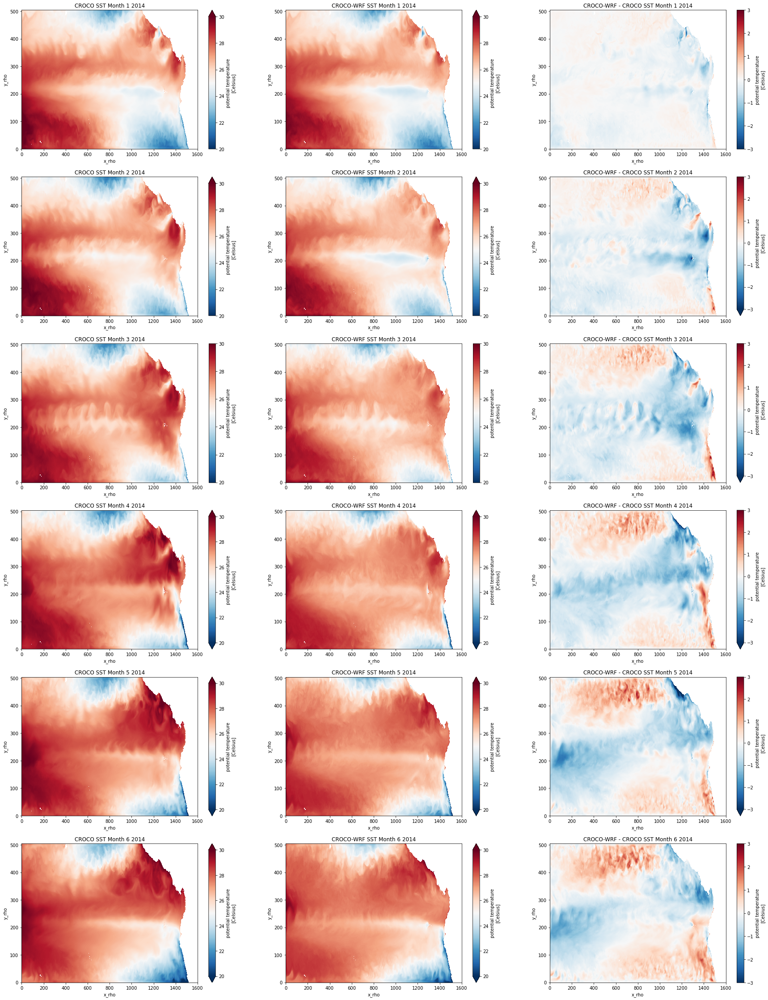

In [14]:
tlims = 20., 30.
tlimsd = -3.,3.

fig, axes = plt.subplots(nrows=6,ncols=3,figsize=(30,40))
for mn in range(6):
    CROCO.temp.isel(s_rho=-1).isel(time_counter=mn).plot(ax=axes[mn][0],vmin=tlims[0],vmax=tlims[1],cmap='RdBu_r')
    CROCO_WRF.temp.isel(s_rho=-1).isel(time_counter=mn).plot(ax=axes[mn][1],vmin=tlims[0],vmax=tlims[1],cmap='RdBu_r')
    DIFF.temp.isel(s_rho=-1).isel(time_counter=mn).plot(ax=axes[mn][2],vmin=tlimsd[0],vmax=tlimsd[1],cmap='RdBu_r')
    axes[mn][0].set_title('CROCO SST Month ' + str(mn+1) + ' 2014')
    axes[mn][1].set_title('CROCO-WRF SST Month ' + str(mn+1) + ' 2014')
    axes[mn][2].set_title('CROCO-WRF - CROCO SST Month ' + str(mn+1) + ' 2014')

## SSH differences:

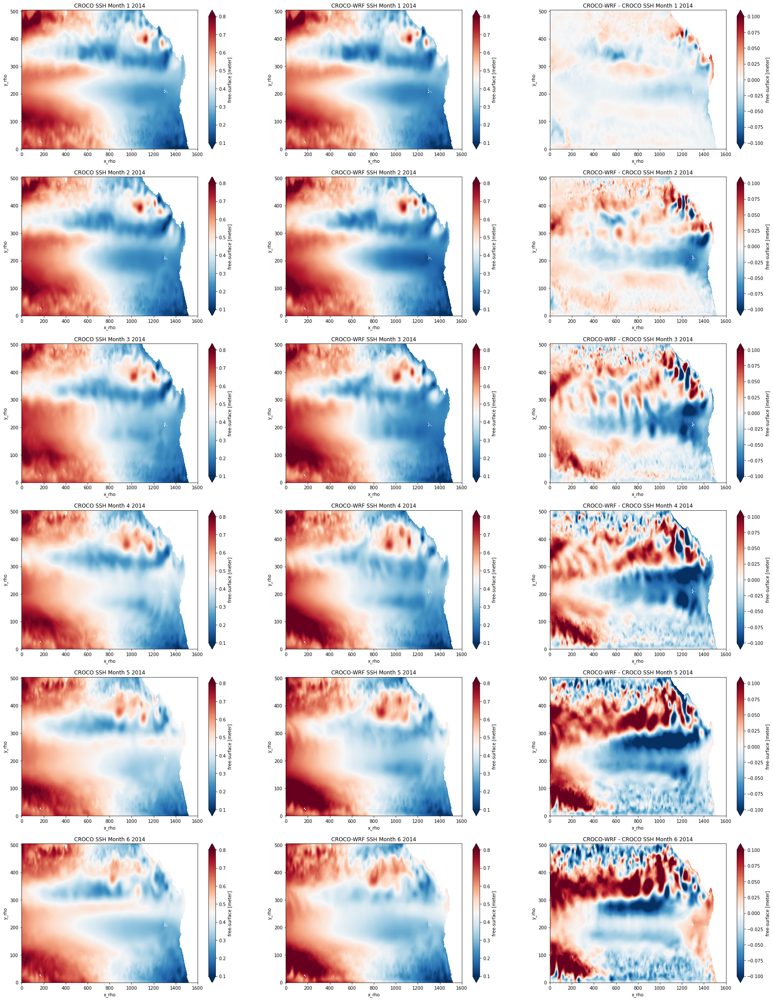

In [15]:
tlims = 0.1, 0.8
tlimsd = -0.1, 0.1

fig, axes = plt.subplots(nrows=6,ncols=3,figsize=(30,40))
for mn in range(6):
    CROCO.zeta.isel(time_counter=mn).plot(ax=axes[mn][0],vmin=tlims[0],vmax=tlims[1],cmap='RdBu_r')
    CROCO_WRF.zeta.isel(time_counter=mn).plot(ax=axes[mn][1],vmin=tlims[0],vmax=tlims[1],cmap='RdBu_r')
    DIFF.zeta.isel(time_counter=mn).plot(ax=axes[mn][2],vmin=tlimsd[0],vmax=tlimsd[1],cmap='RdBu_r')
    axes[mn][0].set_title('CROCO SSH Month ' + str(mn+1) + ' 2014')
    axes[mn][1].set_title('CROCO-WRF SSH Month ' + str(mn+1) + ' 2014')
    axes[mn][2].set_title('CROCO-WRF - CROCO SSH Month ' + str(mn+1) + ' 2014')

## SSS differences:

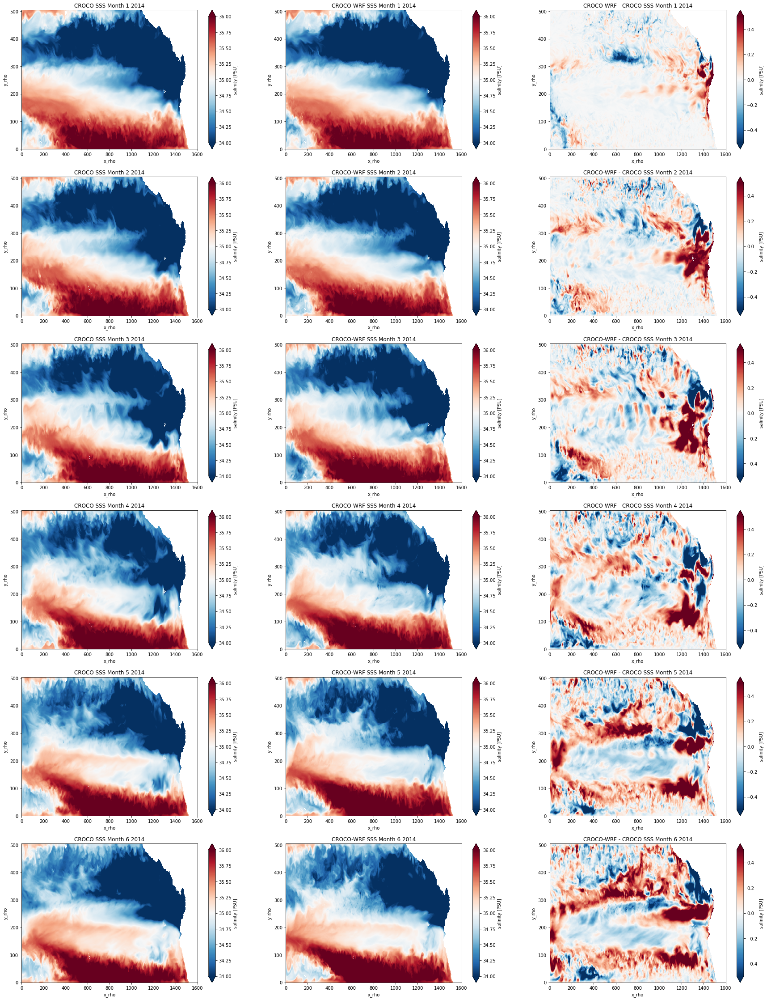

In [16]:
tlims = 34., 36.
tlimsd = -0.5,0.5

fig, axes = plt.subplots(nrows=6,ncols=3,figsize=(30,40))
for mn in range(6):
    CROCO.salt.isel(s_rho=-1).isel(time_counter=mn).plot(ax=axes[mn][0],vmin=tlims[0],vmax=tlims[1],cmap='RdBu_r')
    CROCO_WRF.salt.isel(s_rho=-1).isel(time_counter=mn).plot(ax=axes[mn][1],vmin=tlims[0],vmax=tlims[1],cmap='RdBu_r')
    DIFF.salt.isel(s_rho=-1).isel(time_counter=mn).plot(ax=axes[mn][2],vmin=tlimsd[0],vmax=tlimsd[1],cmap='RdBu_r')
    axes[mn][0].set_title('CROCO SSS Month ' + str(mn+1) + ' 2014')
    axes[mn][1].set_title('CROCO-WRF SSS Month ' + str(mn+1) + ' 2014')
    axes[mn][2].set_title('CROCO-WRF - CROCO SSS Month ' + str(mn+1) + ' 2014')

## Zonal Wind Stress differences:

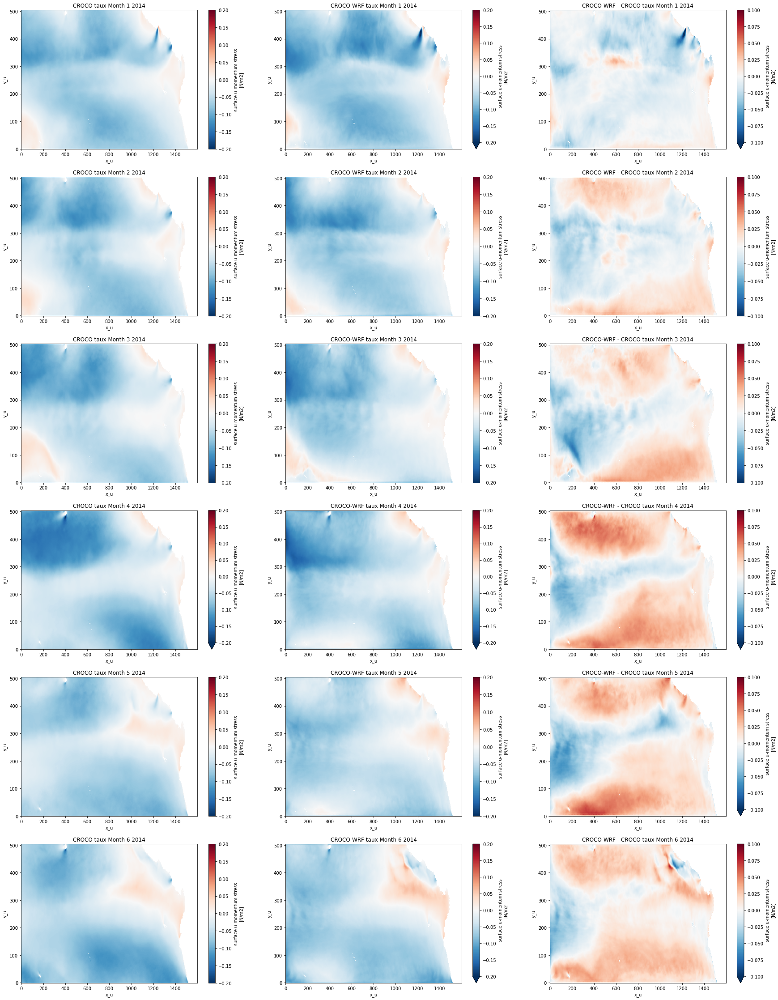

In [19]:
tlims = -0.2, 0.2
tlimsd = -0.1,0.1

fig, axes = plt.subplots(nrows=6,ncols=3,figsize=(30,40))
for mn in range(6):
    CROCO.sustr.isel(time_counter=mn).plot(ax=axes[mn][0],vmin=tlims[0],vmax=tlims[1],cmap='RdBu_r')
    CROCO_WRF.sustr.isel(time_counter=mn).plot(ax=axes[mn][1],vmin=tlims[0],vmax=tlims[1],cmap='RdBu_r')
    DIFF.sustr.isel(time_counter=mn).plot(ax=axes[mn][2],vmin=tlimsd[0],vmax=tlimsd[1],cmap='RdBu_r')
    axes[mn][0].set_title('CROCO taux Month ' + str(mn+1) + ' 2014')
    axes[mn][1].set_title('CROCO-WRF taux Month ' + str(mn+1) + ' 2014')
    axes[mn][2].set_title('CROCO-WRF - CROCO taux Month ' + str(mn+1) + ' 2014')

## Zonal Surface Current

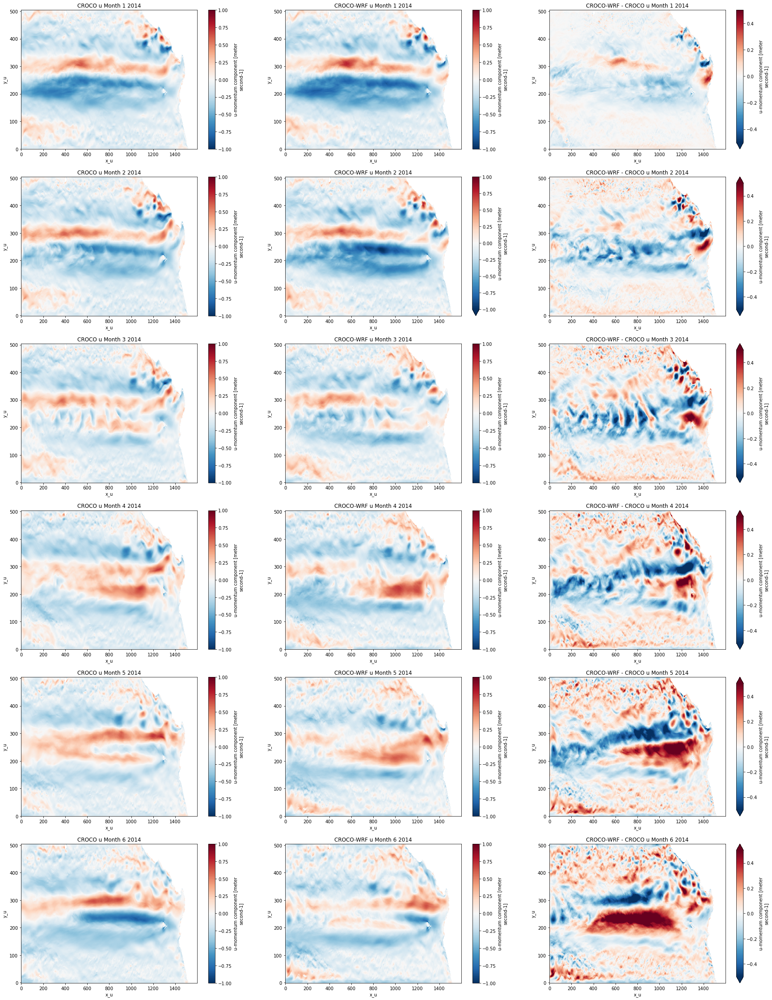

In [20]:
tlims = -1., 1.
tlimsd = -0.5,0.5

fig, axes = plt.subplots(nrows=6,ncols=3,figsize=(30,40))
for mn in range(6):
    CROCO.u.isel(s_rho=-1).isel(time_counter=mn).plot(ax=axes[mn][0],vmin=tlims[0],vmax=tlims[1],cmap='RdBu_r')
    CROCO_WRF.u.isel(s_rho=-1).isel(time_counter=mn).plot(ax=axes[mn][1],vmin=tlims[0],vmax=tlims[1],cmap='RdBu_r')
    DIFF.u.isel(s_rho=-1).isel(time_counter=mn).plot(ax=axes[mn][2],vmin=tlimsd[0],vmax=tlimsd[1],cmap='RdBu_r')
    axes[mn][0].set_title('CROCO u Month ' + str(mn+1) + ' 2014')
    axes[mn][1].set_title('CROCO-WRF u Month ' + str(mn+1) + ' 2014')
    axes[mn][2].set_title('CROCO-WRF - CROCO u Month ' + str(mn+1) + ' 2014')

## Meridional Surface Current

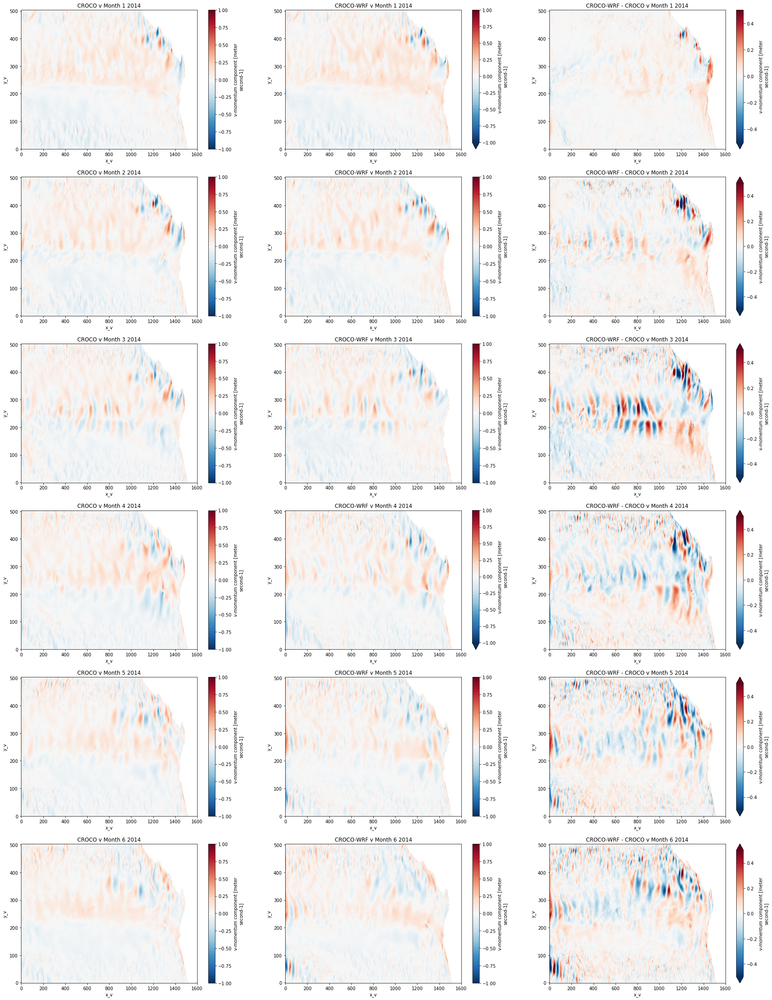

In [22]:
tlims = -1., 1.
tlimsd = -0.5,0.5

fig, axes = plt.subplots(nrows=6,ncols=3,figsize=(30,40))
for mn in range(6):
    CROCO.v.isel(s_rho=-1).isel(time_counter=mn).plot(ax=axes[mn][0],vmin=tlims[0],vmax=tlims[1],cmap='RdBu_r')
    CROCO_WRF.v.isel(s_rho=-1).isel(time_counter=mn).plot(ax=axes[mn][1],vmin=tlims[0],vmax=tlims[1],cmap='RdBu_r')
    DIFF.v.isel(s_rho=-1).isel(time_counter=mn).plot(ax=axes[mn][2],vmin=tlimsd[0],vmax=tlimsd[1],cmap='RdBu_r')
    axes[mn][0].set_title('CROCO v Month ' + str(mn+1) + ' 2014')
    axes[mn][1].set_title('CROCO-WRF v Month ' + str(mn+1) + ' 2014')
    axes[mn][2].set_title('CROCO-WRF - CROCO v Month ' + str(mn+1) + ' 2014')